# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Fixed-variances" data-toc-modified-id="Fixed-variances-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Fixed variances</a></div><div class="lev1 toc-item"><a href="#Sum-of-products,-freed-variances" data-toc-modified-id="Sum-of-products,-freed-variances-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Sum of products, freed variances</a></div><div class="lev1 toc-item"><a href="#Sum-of-products,-all-parameters-free" data-toc-modified-id="Sum-of-products,-all-parameters-free-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Sum of products, all parameters free</a></div><div class="lev2 toc-item"><a href="#Simpler" data-toc-modified-id="Simpler-31"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Simpler</a></div><div class="lev1 toc-item"><a href="#STAN-Imputations" data-toc-modified-id="STAN-Imputations-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>STAN Imputations</a></div><div class="lev1 toc-item"><a href="#Aggregating--imputation-MSE-over-all-windows" data-toc-modified-id="Aggregating--imputation-MSE-over-all-windows-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Aggregating  imputation MSE over all windows</a></div><div class="lev1 toc-item"><a href="#Aggregating-nearby-pred-diagnostics" data-toc-modified-id="Aggregating-nearby-pred-diagnostics-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Aggregating nearby-pred diagnostics</a></div>

In [1]:
const SAVED_DIR = "/Volumes/Samsung250GB/temperature_model/saved"

"/Volumes/Samsung250GB/temperature_model/saved"

In [2]:
data_dir="../"

"../"

In [3]:
include("../src/batch_diagnostics.jl")
include("../src/plot_diagnostics.jl")

plot_residuals (generic function with 1 method)

In [4]:
import PyPlot; plt=PyPlot
using LaTeXStrings
plt.rc("figure", dpi=300.0)
plt.rc("figure", figsize=(12,8))
plt.rc("savefig", dpi=300.0)
plt.rc("text", usetex=false)
plt.rc("font", family="serif")
plt.rc("font", serif="Palatino")
;

In [5]:
# obtain the list of stations
isdList=TempModel.read_isdList(;data_dir=data_dir)
# just the Iowa stations
isdSubset=isdList[[(usaf in (725450,725460,725480,725485)) for usaf in isdList[:USAF].values],:]
isdSubset

# obtain the hourly temperature measurements for those stations
hourly_cat=TempModel.read_Stations(isdSubset; data_dir=data_dir)
# mark station 3 (Waterloo) as the test station
itest=3
# separate temperatures into train and test
hourly_train = hourly_cat[hourly_cat[:station].values.!=itest,:]
hourly_test  = hourly_cat[hourly_cat[:station].values.==itest,:]
# get the USAF code for the test station
test_usaf=get(isdSubset[itest,:USAF])

# emulate daily Tx/Tn measurement
hr_measure = Hour(17) # number between 0 and 24
hourly_test[:ts_day] = [TempModel.measurement_date(t, hr_measure) for t in hourly_test[:ts].values]
TnTx = DataTables.by(hourly_test, :ts_day, df -> DataTable(
    Tn=minimum(df[:temp].values), 
    Tx=maximum(df[:temp].values)))
# add column to test data for TnTx (useful for plotting)
test_trimmed=join(hourly_test, TnTx, on=:ts_day)
head(test_trimmed)

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] anynull(::NullableArrays.NullableArray{Float64,1}) at ./deprecated.jl:57
 [3] convert(::Type{Array{Float64,2}}, ::DataTables.DataTable) at /Users/imolk/Library/Julia/packages/v0.6/DataTables/src/abstractdatatable/abstractdatatable.jl:545
 [4] convert(::Type{Array{T,2} where T}, ::DataTables.DataTable) at /Users/imolk/Library/Julia/packages/v0.6/DataTables/src/abstractdatatable/abstractdatatable.jl:535
 [5] #read_isdList#18(::String, ::Function) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/preprocessing.jl:36
 [6] (::TempModel.#kw##read_isdList)(::Array{Any,1}, ::TempModel.#read_isdList) at ./<missing>:0
 [7] include_string(::String, ::String) at ./loading.jl:515
 [8] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages/v0.6/Compat/src/Compat.jl:464
 [9] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/execute_request.

,year,month,day,hour,min,seconds,temp,ts,station,ts_hours,ts_day,Tn,Tx
1,2015,1,1,0,0,0,-8.3,2015-01-01T00:00:00,3,0.0,2015-01-01,-11.1,-3.9
2,2015,1,1,0,54,0,-8.9,2015-01-01T00:54:00,3,0.9,2015-01-01,-11.1,-3.9
3,2015,1,1,1,54,0,-8.9,2015-01-01T01:54:00,3,1.9,2015-01-01,-11.1,-3.9
4,2015,1,1,2,54,0,-9.4,2015-01-01T02:54:00,3,2.9,2015-01-01,-11.1,-3.9
5,2015,1,1,3,54,0,-9.4,2015-01-01T03:54:00,3,3.9,2015-01-01,-11.1,-3.9
6,2015,1,1,4,54,0,-10.0,2015-01-01T04:54:00,3,4.9,2015-01-01,-11.1,-3.9


# Fixed variances

In [6]:
test_fw = FittingWindow(Date(2015,4,8),Date(2015,6,20))

FittingWindow(2015-04-08, 2015-06-20)

In [7]:
GPmodel="fixed_var"

"fixed_var"

In [8]:
nearby_pred = get_nearby(test_fw, GPmodel);

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] &(::BitArray{1}, ::BitArray{1}) at ./deprecated.jl:57
 [3] #argsubset#2(::Bool, ::Bool, ::Function, ::Array{DateTime,1}, ::DateTime, ::DateTime) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/batch_diagnostics.jl:34
 [4] (::#kw##argsubset)(::Array{Any,1}, ::#argsubset, ::Array{DateTime,1}, ::DateTime, ::DateTime) at ./<missing>:0
 [5] #plot_predictive#45(::Bool, ::Bool, ::Bool, ::Bool, ::Function, ::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:35
 [6] plot_predictive(::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:35
 [7] include_string(::String, ::String) at ./loading.jl:515
 [8] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages/v0.6/Compat/src/Compat.jl:464
 [9] execute_request(::

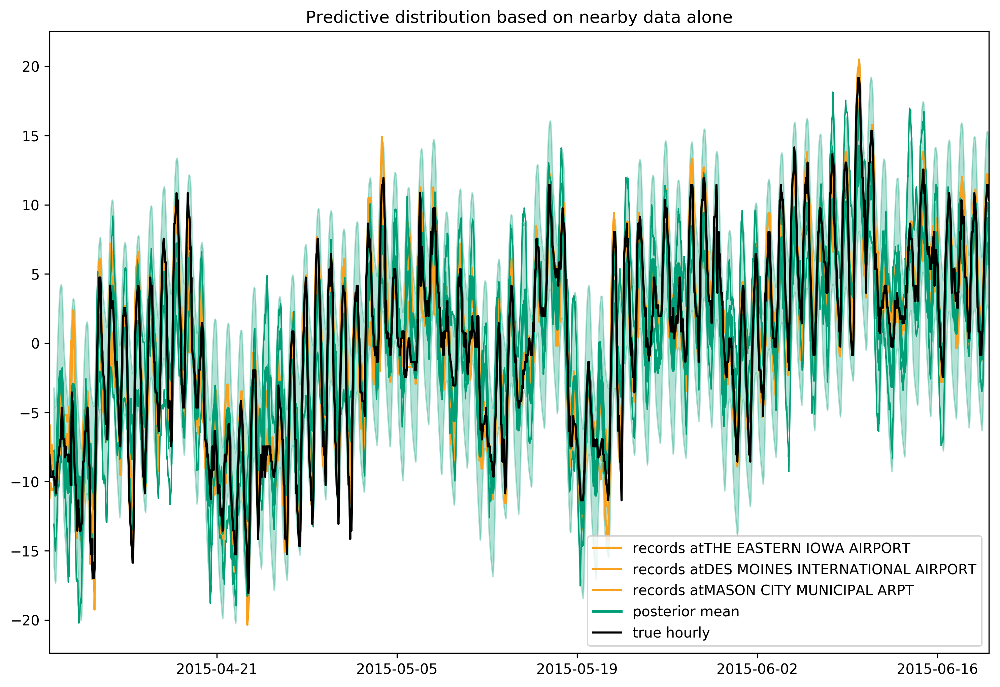

sqrt{T <: Number}(x::AbstractArray{T}) is deprecated, use sqrt.(x) instead.
Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] sqrt(::Array{Float64,1}) at ./deprecated.jl:57
 [3] #plot_predictive#45(::Bool, ::Bool, ::Bool, ::Bool, ::Function, ::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:57
 [4] plot_predictive(::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:35
 [5] include_string(::String, ::String) at ./loading.jl:515
 [6] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages/v0.6/Compat/src/Compat.jl:464
 [7] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/execute_request.jl:154
 [8] eventloop(::ZMQ.Socket) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/eventloop.jl:8
 [9] (::IJulia.##14#17

(735696.0, 735769.0)

In [9]:
plot_predictive(nearby_pred, (DateTime(test_fw.start_date), DateTime(test_fw.end_date)))

In [10]:
print_diagnostics(nearby_pred; ndraws=100)

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] &(::BitArray{1}, ::BitArray{1}) at ./deprecated.jl:57
 [3] #argsubset#2(::Bool, ::Bool, ::Function, ::Array{DateTime,1}, ::DateTime, ::DateTime) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/batch_diagnostics.jl:34
 [4] (::#kw##argsubset)(::Array{Any,1}, ::#argsubset, ::Array{DateTime,1}, ::DateTime, ::DateTime) at ./<missing>:0
 [5] #print_diagnostics#3(::Int64, ::Function, ::TempModel.NearbyPrediction) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/batch_diagnostics.jl:68
 [6] (::#kw##print_diagnostics)(::Array{Any,1}, ::#print_diagnostics, ::TempModel.NearbyPrediction) at ./<missing>:0
 [7] include_string(::String, ::String) at ./loading.jl:515
 [8] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages/v0.6/Compat/src/Compat.jl:464
 [9] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/execute_request.

var(predicted mean - simulated prediction)=9.576718173865212
var(predicted mean - simulated prediction)=6.91309591791064
var(predicted mean - simulated prediction)=9.112056165194574
var(predicted mean - simulated prediction)=10.310768465496865
var(predicted mean - simulated prediction)=7.789825379308272
E(var(predicted mean - predictive draw))=9.562660709290974
var(truth - predicted mean)=6.090607796619109


Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] &(::BitArray{1}, ::BitArray{1}) at ./deprecated.jl:57
 [3] #argsubset#2(::Bool, ::Bool, ::Function, ::Array{DateTime,1}, ::DateTime, ::DateTime) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/batch_diagnostics.jl:34
 [4] (::#kw##argsubset)(::Array{Any,1}, ::#argsubset, ::Array{DateTime,1}, ::DateTime, ::DateTime) at ./<missing>:0
 [5] plot_residuals(::TempModel.NearbyPrediction) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:82
 [6] include_string(::String, ::String) at ./loading.jl:515
 [7] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages/v0.6/Compat/src/Compat.jl:464
 [8] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/execute_request.jl:154
 [9] eventloop(::ZMQ.Socket) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/eventloop.jl:8
 [10] (::IJulia.##14#17)() at ./task.jl

var(truth - predicted mean)=6

Stacktrace:


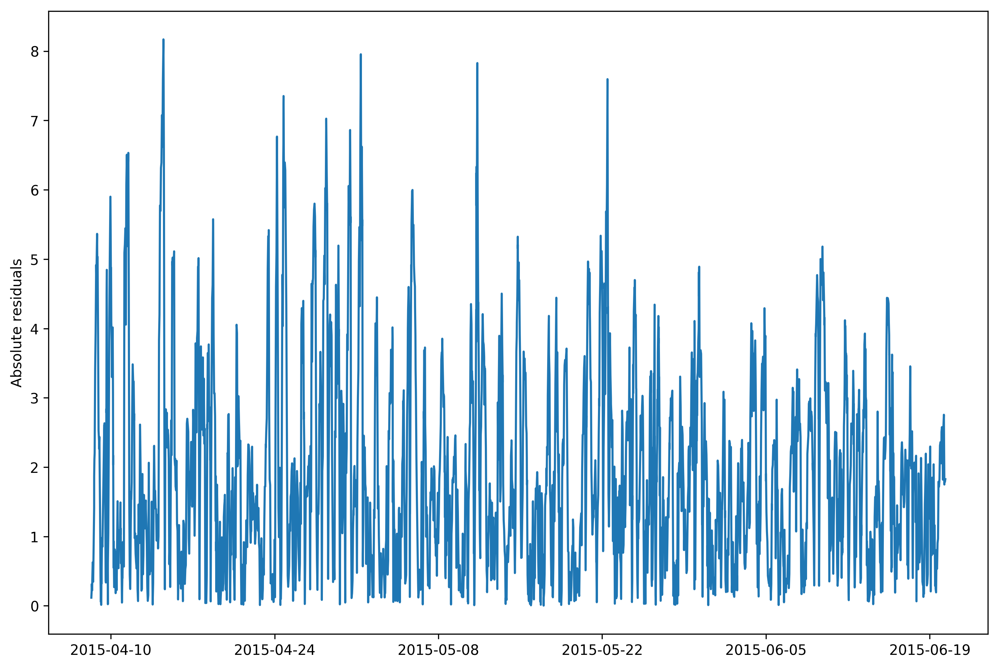

.090607796619109


 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] abs(::Array{Float64,1}) at ./deprecated.jl:57
 [3] plot_residuals(::TempModel.NearbyPrediction) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:94
 [4] include_string(::String, ::String) at ./loading.jl:515
 [5] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages/v0.6/Compat/src/Compat.jl:464
 [6] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/execute_request.jl:154
 [7] eventloop(::ZMQ.Socket) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/eventloop.jl:8
 [8] (::IJulia.##14#17)() at ./task.jl:335
while loading In[11], in expression starting on line 1


PyObject <matplotlib.text.Text object at 0x153e9c4a8>

In [11]:
plot_residuals(nearby_pred)

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] &(::BitArray{1}, ::BitArray{1}) at ./deprecated.jl:57
 [3] #argsubset#2(::Bool, ::Bool, ::Function, ::Array{DateTime,1}, ::DateTime, ::DateTime) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/batch_diagnostics.jl:34
 [4] (::#kw##argsubset)(::Array{Any,1}, ::#argsubset, ::Array{DateTime,1}, ::DateTime, ::DateTime) at ./<missing>:0
 [5] #plot_predictive#45(::Bool, ::Bool, ::Bool, ::Bool, ::Function, ::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:35
 [6] plot_predictive(::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:35
 [7] include_string(::String, ::String) at ./loading.jl:515
 [8] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages/v0.6/Compat/src/Compat.jl:464
 [9] execute_request(::

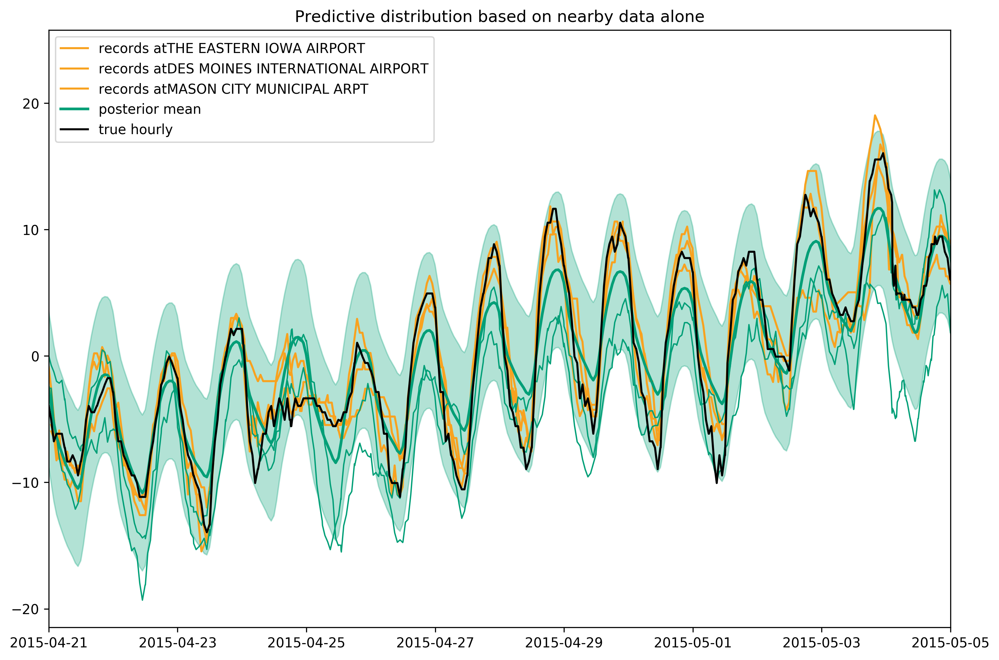

depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] sqrt(::Array{Float64,1}) at ./deprecated.jl:57
 [3] #plot_predictive#45(::Bool, ::Bool, ::Bool, ::Bool, ::Function, ::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:57
 [4] plot_predictive(::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:35
 [5] include_string(::String, ::String) at ./loading.jl:515
 [6] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages/v0.6/Compat/src/Compat.jl:464
 [7] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/execute_request.jl:154
 [8] eventloop(::ZMQ.Socket) at /Users/imolk/Library/Julia/packages/v0.6/IJulia/src/eventloop.jl:8
 [9] (::IJulia.##14#17)() at ./task.jl:335
while loading In[12], in expression starting on line 1


(735709.0, 735723.0)

In [12]:
plot_predictive(nearby_pred, (DateTime(2015,4,21),DateTime(2015,5,5)))

# Sum of products, freed variances

In [22]:
GPmodel = "free_var"

"free_var"

In [23]:
nearby_pred = get_nearby(test_fw, GPmodel);

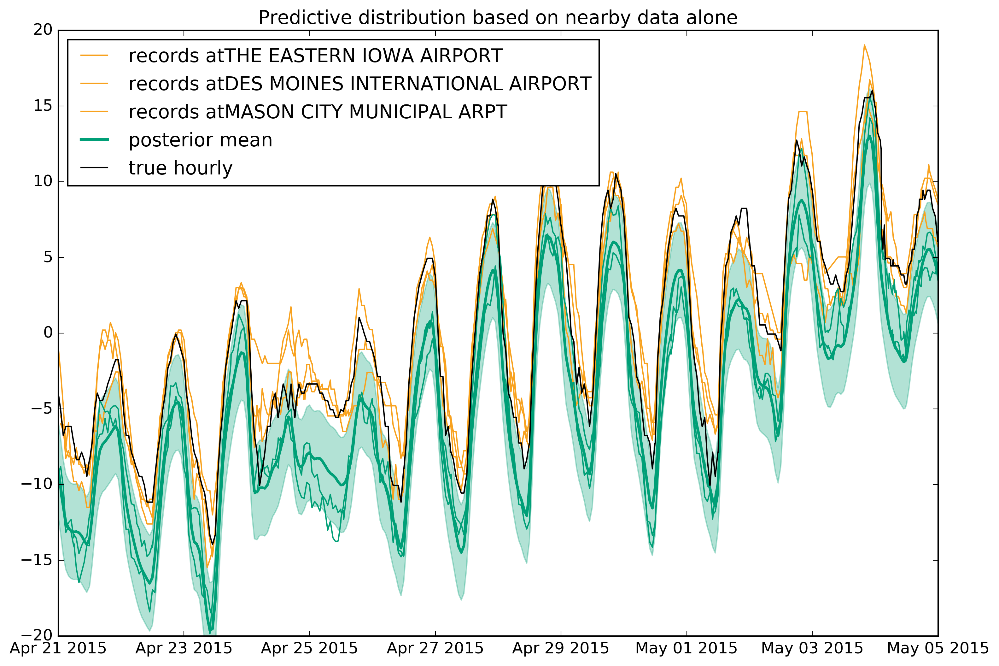

(-20.0,20.0)

In [24]:
plot_predictive(nearby_pred, (DateTime(2015,4,21),DateTime(2015,5,5)))

In [25]:
@time print_diagnostics(nearby_pred; ndraws=100)

var(predicted mean - simulated prediction)=2.7062249254704334
var(predicted mean - simulated prediction)=2.4821934947564714
var(predicted mean - simulated prediction)=2.2131020640353243
var(predicted mean - simulated prediction)=2.2814233119730156
var(predicted mean - simulated prediction)=2.413903014197223
E(var(predicted mean - predictive draw))=2.4010601200415285
var(truth - predicted mean)=1.2494531076575177
  1.045780 seconds (10.42 k allocations: 312.281 MB, 15.52% gc time)


# Sum of products, all parameters free

In [26]:
GPmodel = "sumprod"

"sumprod"

In [27]:
nearby_pred = get_nearby(test_fw, GPmodel);

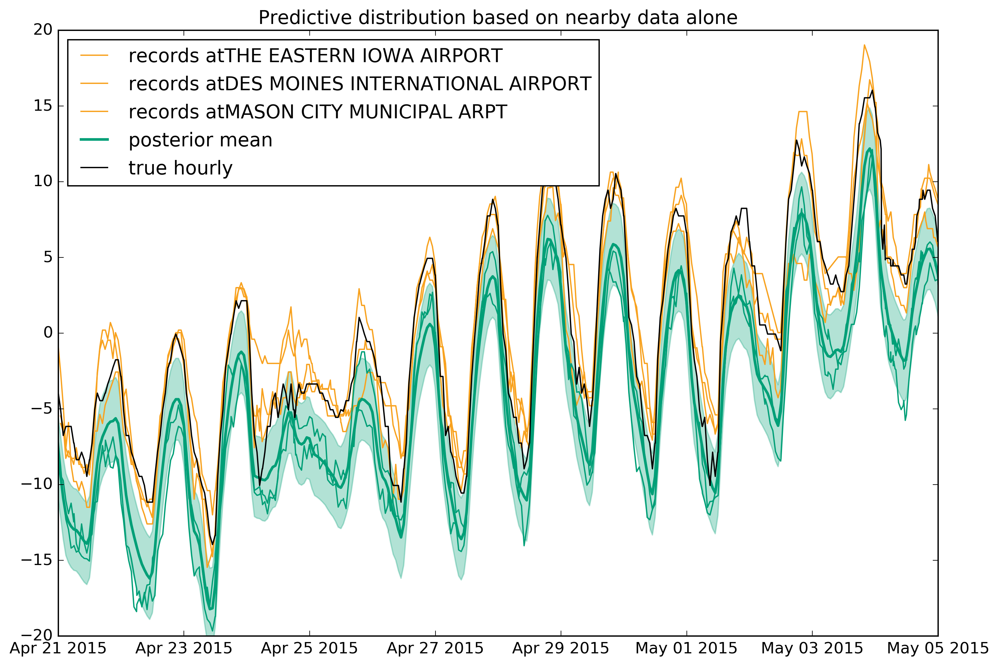

(-20.0,20.0)

In [28]:
plot_predictive(nearby_pred, (DateTime(2015,4,21),DateTime(2015,5,5)))

In [29]:
@time print_diagnostics(nearby_pred; ndraws=100)

var(predicted mean - simulated prediction)=1.6663196638087876
var(predicted mean - simulated prediction)=1.9448324901525404
var(predicted mean - simulated prediction)=2.3187250908602985
var(predicted mean - simulated prediction)=1.7971799291144093
var(predicted mean - simulated prediction)=2.108992764429082
E(var(predicted mean - predictive draw))=1.8232575774126312
var(truth - predicted mean)=1.3771718160277167
  1.002208 seconds (10.21 k allocations: 312.251 MB, 17.87% gc time)


Annoyingly, we again see that even though this model has more free parameters, and the marginal likelihood was significantly lower (when we optimized all the parameters), the predictive variance is actually worse (higher).

## Simpler

In [13]:
GPmodel = "simpler"

"simpler"

In [14]:
nearby_pred = get_nearby(test_fw, GPmodel);

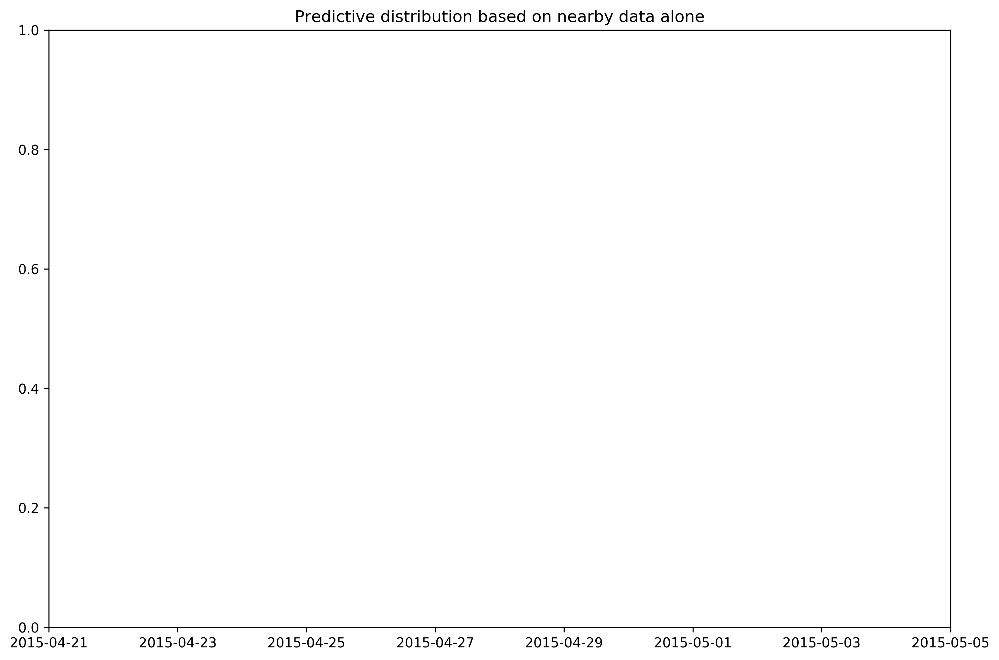

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] &(::BitArray{1}, ::BitArray{1}) at ./deprecated.jl:57
 [3] #argsubset#2(::Bool, ::Bool, ::Function, ::Array{DateTime,1}, ::DateTime, ::DateTime) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/batch_diagnostics.jl:34
 [4] (::#kw##argsubset)(::Array{Any,1}, ::#argsubset, ::Array{DateTime,1}, ::DateTime, ::DateTime) at ./<missing>:0
 [5] #plot_predictive#45(::Bool, ::Bool, ::Bool, ::Bool, ::Function, ::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at /Users/imolk/Documents/Harvard/Natesh/temperature_model/src/plot_diagnostics.jl:35
 [6] (::#kw##plot_predictive)(::Array{Any,1}, ::#plot_predictive, ::TempModel.NearbyPrediction, ::Tuple{DateTime,DateTime}) at ./<missing>:0
 [7] include_string(::String, ::String) at ./loading.jl:515
 [8] include_string(::Module, ::String, ::String) at /Users/imolk/Library/Julia/packages/v0.6/Compat/src/Compat.jl:464
 [9] execute_request(::ZMQ.Socket, ::IJulia.Msg

(735709.0, 735723.0)

In [19]:
plot_predictive(nearby_pred, (DateTime(2015,4,21),DateTime(2015,5,5));
    truth=false,
    imputations=false,
    neighbours=false,
    mean_impt=false
)

# STAN Imputations

In [31]:
stan_increment = Day(3)
stan_days = Day(9)
janfirst = Date(2015,1,1)
;

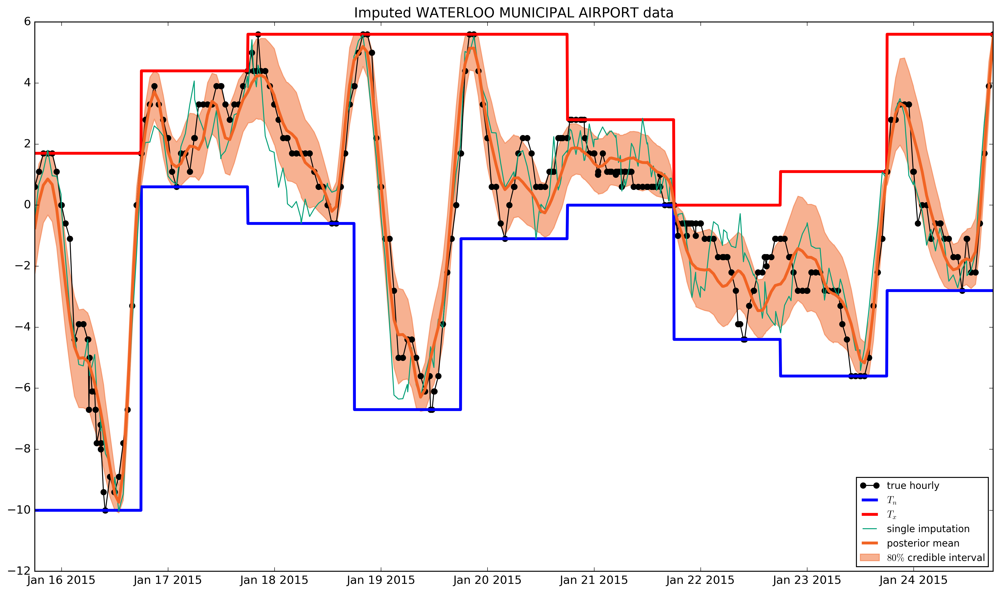

In [37]:
GPmodel = "free_var"
window_num = 6
stan_fw = get_window(window_num)
chains, _ts = get_chains_and_ts(stan_fw, GPmodel)
temp_impute = get_temperatures_reparam(chains)
test_subsubset = get_test_fw(test_trimmed, stan_fw)

plot_truth(test_subsubset)
plot_imputations(test_subsubset[:ts].values, temp_impute)

plt.legend(loc="best", fontsize="small")
plt.gcf()[:set_size_inches](18.0, 10.0)
plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
;

In [40]:
diag = ImputationDiagnostic(0.0, 0.0, 0)
begin
    temp_impute = get_temperatures_reparam(chains)
    diag += ImputationDiagnostic(temp_impute, test_subsubset)
    @printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(diag))
    @printf("MSE(truth - predicted mean)=             %.5f\n", mse(diag))
end

E(var(predicted mean - predictive draw))=0.80174
MSE(truth - predicted mean)=             0.80060


# Aggregating  imputation MSE over all windows

In [41]:
all_impt_diagn = Dict{String, Vector{ImputationDiagnostic}}()

Dict{String,Array{ImputationDiagnostic,1}} with 0 entries

In [42]:
GPmodel = "SExSE"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains, ts = get_chains_and_ts(stan_fw, GPmodel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.61446
MSE(truth - predicted mean)=             1.10353


In [43]:
GPmodel = "diurnal"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains, ts = get_chains_and_ts(stan_fw, GPmodel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.69746
MSE(truth - predicted mean)=             1.13723


In [44]:
GPmodel = "fixed_var"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains, ts = get_chains_and_ts(stan_fw, GPmodel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

LoadError: MethodError: no method matching zero(::Type{ImputationDiagnostic})[0m
Closest candidates are:
  zero([1m[31m::Type{Base.LibGit2.Oid}[0m) at libgit2/oid.jl:88
  zero([1m[31m::Type{Base.Pkg.Resolve.VersionWeights.VWPreBuildItem}[0m) at pkg/resolve/versionweight.jl:80
  zero([1m[31m::Type{Base.Pkg.Resolve.VersionWeights.VWPreBuild}[0m) at pkg/resolve/versionweight.jl:120
  ...[0m

In [45]:
GPmodel = "free_var"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains, ts = get_chains_and_ts(stan_fw, GPmodel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.89707
MSE(truth - predicted mean)=             1.14955


In [46]:
GPmodel = "sumprod"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains, ts = get_chains_and_ts(stan_fw, GPmodel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.95036
MSE(truth - predicted mean)=             1.15171


In [47]:
GPmodel = "simpler"
all_impt_diagn[GPmodel] = ImputationDiagnostic[]
for window_num in 1:150
    stan_fw = get_window(window_num)
    center_fw = window_center(stan_fw, stan_increment)
    try
        chains, ts = get_chains_and_ts(stan_fw, GPmodel)
    catch
        break
    end
    temp_impute = get_temperatures_reparam(chains)
    test_stan_fw = get_test_fw(test_trimmed, stan_fw)
    arg_center_fw = arg_test_fw(test_stan_fw, center_fw)
    test_center_fw = get_test_fw(test_stan_fw, center_fw)
    temp_impute_center = temp_impute[:,arg_center_fw,:]
    diagn = ImputationDiagnostic(temp_impute_center, test_center_fw)
    push!(all_impt_diagn[GPmodel], diagn)
end
@printf("E(var(predicted mean - predictive draw))=%.5f\n", EVarError(sum(all_impt_diagn[GPmodel])))
@printf("MSE(truth - predicted mean)=             %.5f\n", mse(sum(all_impt_diagn[GPmodel])))

E(var(predicted mean - predictive draw))=0.82265
MSE(truth - predicted mean)=             1.06889


In [78]:
for GPmodel in keys(all_impt_diagn)
    diagns = all_impt_diagn[GPmodel]
    @printf("model: %s\n", GPmodel)
    @printf("E(var(predicted mean - predictive draw))=%.3f\n", EVarError(sum(diagns)))
    @printf("MSE(truth - predicted mean)=             %.3f\n", mse(sum(diagns)))
    print("=============================\n")
end

model: free_var
E(var(predicted mean - predictive draw))=0.897
MSE(truth - predicted mean)=             1.150
model: sumprod
E(var(predicted mean - predictive draw))=0.950
MSE(truth - predicted mean)=             1.152
model: SExSE
E(var(predicted mean - predictive draw))=0.614
MSE(truth - predicted mean)=             1.104
model: simpler
E(var(predicted mean - predictive draw))=0.823
MSE(truth - predicted mean)=             1.069
model: diurnal
E(var(predicted mean - predictive draw))=0.697
MSE(truth - predicted mean)=             1.137


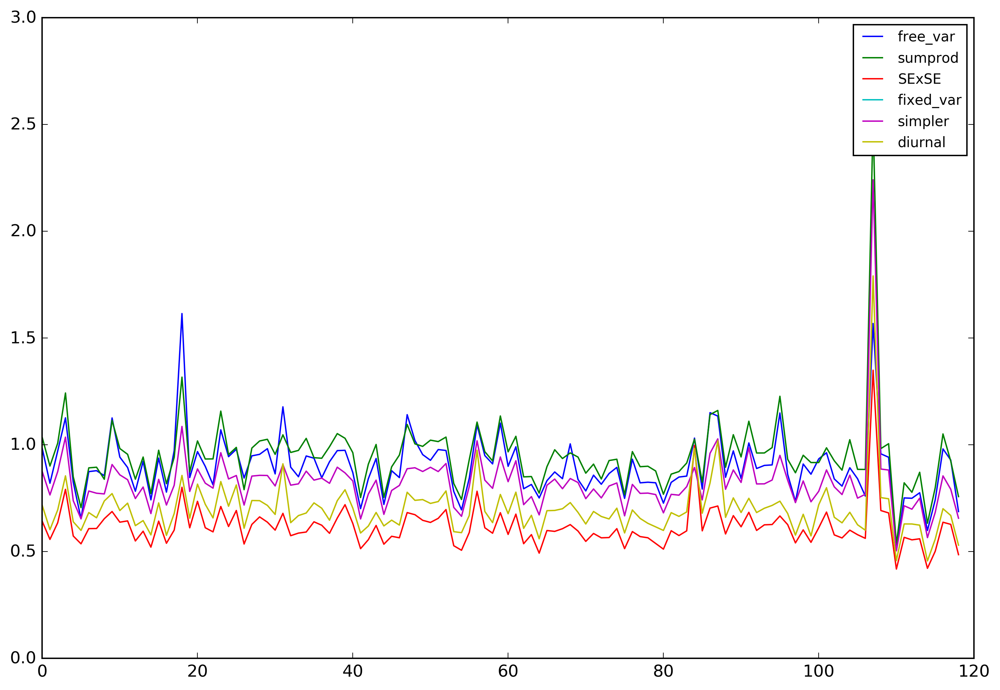

PyObject <matplotlib.legend.Legend object at 0x322ba2350>

In [48]:
for GPmodel in keys(all_impt_diagn)
    diagns = all_impt_diagn[GPmodel]
    plt.plot([EVarError(d) for d in diagns], label=GPmodel)
end
plt.legend(loc="upper right", fontsize="small")

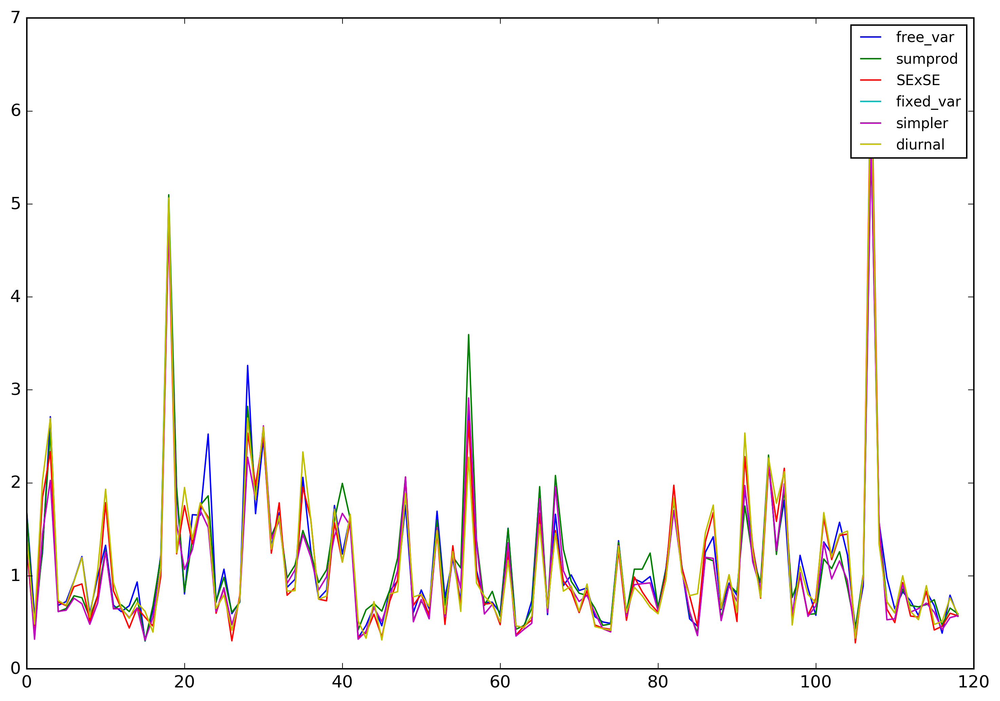

PyObject <matplotlib.legend.Legend object at 0x30f55a690>

In [74]:
for GPmodel in keys(all_impt_diagn)
    diagns = all_impt_diagn[GPmodel]
    plt.plot([mse(d) for d in diagns], label=GPmodel)
end
plt.legend(loc="upper right", fontsize="small")

In [49]:
GPmodel = "sumprod"
window_num = 6
stan_fw = get_window(window_num)
chains = get_chains(stan_fw, GPmodel)
temp_impute = get_temperatures_reparam(chains)
test_subsubset = get_test_fw(test_trimmed, stan_fw)

plot_truth(test_subsubset)
plot_imputations(test_subsubset[:ts].values, temp_impute)

plt.legend(loc="best", fontsize="small")
plt.gcf()[:set_size_inches](18.0, 10.0)
plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
;

LoadError: UndefVarError: get_chains not defined

# Aggregating nearby-pred diagnostics

In [50]:
type NearbyPredDiagnostic
    sumEVarError::Float64
    sumVarError::Float64
    n::Int
end

In [51]:
function +(diag1::NearbyPredDiagnostic,diag2::NearbyPredDiagnostic)
    return NearbyPredDiagnostic(
        diag1.sumEVarError + diag2.sumEVarError,
        diag1.sumVarError + diag2.sumVarError,
        diag1.n + diag2.n
        )
end

+ (generic function with 316 methods)

In [52]:
test_windows = [
    FittingWindow(Date(2015,1,1),Date(2015,3,14)),
    FittingWindow(Date(2015,1,25),Date(2015,4,8)),
    FittingWindow(Date(2015,2,18),Date(2015,5,2)),
    FittingWindow(Date(2015,3,14),Date(2015,5,26)),
    FittingWindow(Date(2015,4,8),Date(2015,6,20)),
    FittingWindow(Date(2015,5,2),Date(2015,7,14)),
    FittingWindow(Date(2015,5,26),Date(2015,8,7)),
    FittingWindow(Date(2015,6,20),Date(2015,9,1)),
    FittingWindow(Date(2015,7,14),Date(2015,9,25)),
    FittingWindow(Date(2015,8,7),Date(2015,10,19)),
    FittingWindow(Date(2015,9,1),Date(2015,11,13)),
    FittingWindow(Date(2015,9,25),Date(2015,12,7)),
    FittingWindow(Date(2015,10,19),Date(2015,12,31)),
]

13-element Array{FittingWindow,1}:
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-25,2015-04-08)
 FittingWindow(2015-02-18,2015-05-02)
 FittingWindow(2015-03-14,2015-05-26)
 FittingWindow(2015-04-08,2015-06-20)
 FittingWindow(2015-05-02,2015-07-14)
 FittingWindow(2015-05-26,2015-08-07)
 FittingWindow(2015-06-20,2015-09-01)
 FittingWindow(2015-07-14,2015-09-25)
 FittingWindow(2015-08-07,2015-10-19)
 FittingWindow(2015-09-01,2015-11-13)
 FittingWindow(2015-09-25,2015-12-07)
 FittingWindow(2015-10-19,2015-12-31)

In [53]:
test_windows[3].end_date

2015-05-02

In [54]:
DateTime(2015,5,2,0,0,0) <= Date(2015,5,2)

true

In [55]:
""" 
    Is window A inside of window B?
"""
function a_isinside_b(t::DateTime, b::FittingWindow)
    start_after = t >= b.start_date
    end_before = t <= b.end_date+Day(1)
    return start_after & end_before
end
"""
    How much buffer time is there on either side of the window?
"""
function buffer(t::DateTime, b::FittingWindow)
    start_diff = abs(t - b.start_date)
    end_diff = abs(t - (b.end_date+Day(1)))
    return min(start_diff, end_diff)
end
""" 
    Amongst a list of candidate windows `cand`, find the window that includes `wind`
    with the largest buffer on either sides.
"""
function find_best_window(t::DateTime, cands::Vector{FittingWindow})
    incl_wdows = [fw for fw in cands if a_isinside_b(t, fw)]
    buffers = [buffer(t, fw) for fw in incl_wdows]
    imax = indmax(buffers)
    best_window = incl_wdows[imax]
    return best_window
end

find_best_window

In [56]:
test_ts = hourly_test[:ts].values;

In [57]:
best_pred_window = [find_best_window(t, test_windows) for t in test_ts]
;

In [58]:
best_pred_window

12695-element Array{FittingWindow,1}:
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 FittingWindow(2015-01-01,2015-03-14)
 ⋮                                   
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWindow(2015-10-19,2015-12-31)
 FittingWind

In [59]:
A = randn(10,10)

10×10 Array{Float64,2}:
 -1.13762     1.11307     0.201127   …  -0.690189   0.976274   0.670232
 -1.28817    -1.28268     0.100042      -0.383721  -1.86468    0.569134
 -0.0828167  -1.37166    -0.368744      -0.33543    2.09021    1.27436 
 -1.18267     0.412021   -0.107338      -0.758107   0.810711  -0.361699
  0.0351078   1.68064    -2.54152        0.462593  -0.797983  -2.17312 
  0.46571    -0.0162426   2.32849    …  -1.96027   -0.664478   0.353229
  0.731386   -1.20949    -0.0136373      0.272538  -0.663195   0.607724
 -1.21067    -0.0502938   0.144449      -1.09697    1.06494   -0.705789
  0.871476    0.602602    0.544919       0.954476   2.54907    1.67779 
  1.5796     -1.5292     -1.27153       -0.361334   0.744642   1.78553 

In [60]:
function get_diagnostics(nearby::TempModel.NearbyPrediction, ts_start::DateTime, ts_end::DateTime; 
                            ndraws=10000)

    test_subset = subset(test_trimmed, ts_start, ts_end, closed_start=true, closed_end=true)
    
    ts = nearby.ts
    iinside = argsubset(ts, ts_start, ts_end)
    ts = ts[iinside]
    μ = nearby.μ[iinside]
    Σ = full(nearby.Σ)[iinside,iinside]
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ * centering
    distr = MultivariateNormal(μ, Σ)
    temp_true = test_subset[:temp].values
    n = length(ts)
    return NearbyPredDiagnostic(
        mean(var(μ .- rand(distr)) for _ in 1:ndraws)*n,
        var(μ .- temp_true)*n,
        n
    )
end

get_diagnostics (generic function with 1 method)

In [61]:
all_nearby_diagn = Dict{String, Vector{NearbyPredDiagnostic}}()

Dict{String,Array{NearbyPredDiagnostic,1}} with 0 entries

In [62]:
GPmodel="SExSE"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [63]:
GPmodel="diurnal"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [64]:
GPmodel="fixed_var"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [65]:
GPmodel="free_var"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [66]:
GPmodel="sumprod"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [67]:
GPmodel="simpler"
all_nearby_diagn[GPmodel] = NearbyPredDiagnostic[]
all_nearby_preds = Dict{FittingWindow, TempModel.NearbyPrediction}()
for fw in test_windows
    all_nearby_preds[fw] = get_nearby(fw, GPmodel)
end
for fw in test_windows
    fw_start, fw_end = extrema(t for (i,t) in enumerate(test_ts) if best_pred_window[i] == fw)
    diagn = get_diagnostics(all_nearby_preds[fw], fw_start, fw_end; ndraws=1000)
    println("-----")
    push!(all_nearby_diagn[GPmodel], diagn)
end

-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----
-----


In [68]:
collect(keys(all_nearby_diagn))

6-element Array{String,1}:
 "free_var" 
 "sumprod"  
 "SExSE"    
 "fixed_var"
 "simpler"  
 "diurnal"  

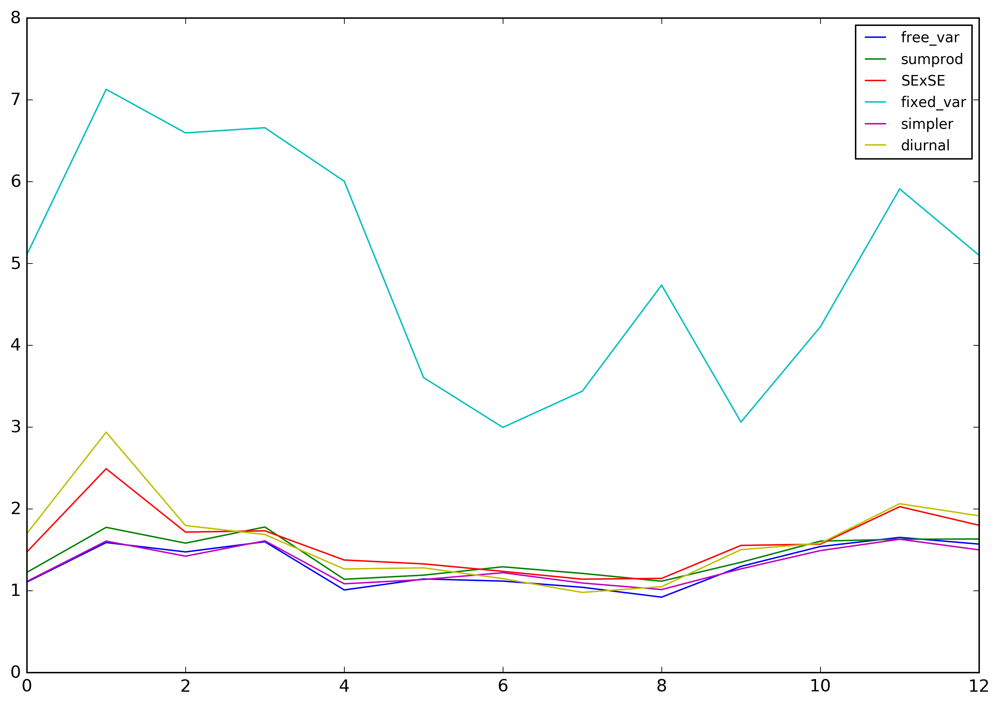

PyObject <matplotlib.legend.Legend object at 0x322c50390>

In [69]:
for GPmodel in keys(all_nearby_diagn)
    diagns = all_nearby_diagn[GPmodel]
    plt.plot([d.sumVarError/d.n for d in diagns], label=GPmodel)
end
plt.legend(loc="upper right", fontsize="small")

In [70]:
sum(all_nearby_diagn["diurnal"])

NearbyPredDiagnostic(12364.260322293852,20724.932846399304,12695)

In [71]:
@assert sum(all_nearby_diagn["diurnal"]).n == nrow(hourly_test)

In [72]:
for GPmodel in keys(all_nearby_diagn)
    @printf("model: %s\n", GPmodel)
    diagns = all_nearby_diagn[GPmodel]
    sumdiag = sum(diagns)
    @printf("Expected variance:  %.3f\n", sumdiag.sumEVarError/sumdiag.n)
    @printf("Empirical variance: %.3f\n", sumdiag.sumVarError/sumdiag.n)
    print("==========\n")
end

model: free_var
Expected variance:  2.321
Empirical variance: 1.314
model: sumprod
Expected variance:  1.765
Empirical variance: 1.423
model: SExSE
Expected variance:  0.875
Empirical variance: 1.589
model: fixed_var
Expected variance:  8.791
Empirical variance: 4.991
model: simpler
Expected variance:  1.190
Empirical variance: 1.319
model: diurnal
Expected variance:  0.974
Empirical variance: 1.633
